#**Segmentation and Forecasting of Bitcoin Price Using Deep Learning**

**Developed By:** *Saadi, Monib*




### Calling and Installing Require Libraries

In [2]:
!pip install pandas_ta

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.1/115.1 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pandas_ta: filename=pandas_ta-0.3.14b0-py3-none-any.whl size=218909 sha256=8d2791ecec051b4c2574650bd2dffeab0b80f6e6e241c5463a8a85a60c52e1c4
  Stored in directory: /root/.cache/pip/wheels/7f/33/8b/50b245c5c65433cd8f5cb24ac15d97e5a3db2d41a8b6ae957d
Successfully built pandas_ta


In [3]:
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import plotly.graph_objects as go
import datetime
from datetime import datetime, timedelta
import time
import seaborn as sns
from scipy.stats import norm

import pandas_ta as ta

import tensorflow as tf

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


## Data Extraction & Pre-processing

### Raw BTCUSD Price Data

In [ ]:
def fetch_coinbase_data(pair='BTC-USD', granularity=3600):
    url = f'https://api.exchange.coinbase.com/products/{pair}/candles'

    max_records_per_request = 300

    end_time = datetime.now()
    start_time = start_time = datetime(2015, 1, 1)

    all_data = []

    while start_time < end_time:
        batch_end_time = min(start_time + timedelta(seconds=granularity * max_records_per_request), end_time)
        params = {
            'granularity': granularity,
            'start': start_time.isoformat(),
            'end': batch_end_time.isoformat()
        }

        response = requests.get(url, params=params)
        print(f"{response.status_code} - {response.text}")
        data = response.json()

        all_data.extend(data)

        start_time = batch_end_time

        time.sleep(0.4)

    dataFrame = pd.DataFrame(all_data, columns=['Time', 'Low', 'High', 'Open', 'Close', 'Volume'])
    dataFrame['Timestamp'] = pd.to_datetime(dataFrame['Time'], unit='s')
    dataFrame.sort_values('Time', ascending=True, inplace=True)

    return dataFrame

In [ ]:
btcusd_Raw_Dataframe = fetch_coinbase_data()
btcusd_Raw_Dataframe.head()

200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - []
200 - [[1438430400,277.99,279.62,278.09,278.92,110.9475],[1438426800,277.82,280,280,277.82,101.31301086],[1438423200,279.63,280.15,279.89,280.01,66.59119313],[1438419600,279.87,280.45,279.95,279.95,39.681619],[1438416000,278.7,279.95,279.51,279.94,193.98221531],[1438412400,279.5,281.1,281.1,279.51,95.99171507],[1438408800,280.41,282.3,282.3,281.02,104.98944916],[1438405200,282.33,283.66,283.66,282.34,122.4285208],[1438401600,283.43,284,283.67,283.6,153.6969],[1438398000,283,283.85,283.27,283.66,124.1341],[1438394400,282.25,283.61,283.1,283.06,203.8837337],[1438390800,283.1,285.25,285.25,283.1,210.41221372],[1438387200,284.82,285.6,285.2,285.25,175.5137],[1438383600,284.28,285.3,284.8,285.19,221.8227],[1438380000,284.29,285.4,285.03,284.74,190.16958106],[1438376400,284.53,285.75,285.26,285.02,335.51573335],[1438372800,284.75,287,286.92,285.18,37

,Time,Low,High,Open,Close,Volume,Timestamp
279,1437426000,277.92,278.00,277.98,278.00,59.260456,2015-07-20 21:00:00
278,1437429600,277.37,278.50,278.00,278.14,346.995411,2015-07-20 22:00:00
277,1437433200,278.15,280.00,278.31,280.00,376.627552,2015-07-20 23:00:00
276,1437436800,279.38,281.00,279.96,280.89,288.177976,2015-07-21 00:00:00
275,1437440400,280.35,281.15,280.89,280.36,380.933023,2015-07-21 01:00:00


In [ ]:
btcusd_Raw_Dataframe.to_csv('btcusd_Raw_Dataframe.csv', index=False)

In [219]:
btcusd_Raw_Dataframe = pd.read_csv('btcusd_Raw_Dataframe.csv')

In [220]:
print(btcusd_Raw_Dataframe['Timestamp'].min())
print(btcusd_Raw_Dataframe['Timestamp'].max())

2015-07-20 21:00:00
2025-01-27 16:00:00


In [221]:
btcusd_Raw_Dataframe.columns

Index(['Time', 'Low', 'High', 'Open', 'Close', 'Volume', 'Timestamp'], dtype='object')

In [222]:
btcusd_Raw_Dataframe = btcusd_Raw_Dataframe.drop(['Time'],axis=1)

In [223]:
btcusd_Raw_Dataframe.shape

(83724, 6)

In [224]:
btcusd_Raw_Dataframe = btcusd_Raw_Dataframe.set_index('Timestamp')

In [225]:
btcusd_Raw_Dataframe.head()

,Low,High,Open,Close,Volume
Timestamp,,,,,
2015-07-20 21:00:00,277.92,278.00,277.98,278.00,59.260456
2015-07-20 22:00:00,277.37,278.50,278.00,278.14,346.995411
2015-07-20 23:00:00,278.15,280.00,278.31,280.00,376.627552
2015-07-21 00:00:00,279.38,281.00,279.96,280.89,288.177976
2015-07-21 01:00:00,280.35,281.15,280.89,280.36,380.933023


In [ ]:
candle_Sticks = go.Figure(
    data = [go.Candlestick(x = btcusd_Raw_Dataframe.index,
        open = btcusd_Raw_Dataframe['Open'],
        high = btcusd_Raw_Dataframe['High'],
        low = btcusd_Raw_Dataframe['Low'],
        close = btcusd_Raw_Dataframe['Close']
    )])

candle_Sticks.show()

Remove Duplicates

In [226]:
btcusd_Raw_Dataframe = btcusd_Raw_Dataframe[~btcusd_Raw_Dataframe.index.duplicated(keep='first')]

In [227]:
btcusd_Raw_Dataframe.shape

(83446, 5)

Remove those days for which I do not have exactly 24 hours or 24 candle sticks. As data granularity is hourly, even if we have some missing days, the pattern will still be captured.

In [228]:
btcusd_Raw_Dataframe.index = pd.to_datetime(btcusd_Raw_Dataframe.index)
daily_counts = btcusd_Raw_Dataframe.groupby(btcusd_Raw_Dataframe.index.date).size()
valid_days = daily_counts[daily_counts == 24].index
valid_days_dt = pd.to_datetime(valid_days)
btcusd_Raw_Dataframe = btcusd_Raw_Dataframe[btcusd_Raw_Dataframe.index.floor('D').isin(valid_days_dt)]

In [229]:
btcusd_Raw_Dataframe.shape

(82992, 5)

In [230]:
btcusd_Raw_Dataframe.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 82992 entries, 2015-07-21 00:00:00 to 2025-01-26 23:00:00
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Low     82992 non-null  float64
 1   High    82992 non-null  float64
 2   Open    82992 non-null  float64
 3   Close   82992 non-null  float64
 4   Volume  82992 non-null  float64
dtypes: float64(5)
memory usage: 3.8 MB


### Subjective Judgement on segmenting the time series into the required classes:
1. Tight Bear or Bull Channel
2. Broad Bear or Bull Channel
3. Trading Range

**Please Read:**

This judgement is based upon a simple algorithm. First, I calculte the true range of a given segment of fixed length i.e 12, 24 etc. Then, I calculate the slope of the whole segment. I tried to use linear regression for a better slope estimation but due to assumptions required to be fullfilled, i opted for a more simpler slope calculation. Once the slope is calculated, i decide whether the market in this specific segment is in a range (slope < my threshold), bullish (slope > 0), or bearish (slope < 0). Additionally, I calculate a ratio between the absolute change in the segment vs the true range value. And by keeping a manual threshold, i decide between a tight and broad channel. Now this approach is naive in two senses:

1. It assumes a fixed length segment while the price action develops and evolves with time axis. At time t, what seems a tight bull channel and be eventually seen as a range by extending the analysis to t+n candle sticks.
2. I add my subjective bias by manually tweaking the thresholds.

However, still, it achieves a satisfactory categorization.

In [231]:
def compute_atr_segment(high, low, close):

    tr_values = []
    for i in range(1, len(high)):
        tr_current = max(
            high[i] - low[i],
            abs(high[i] - close[i - 1]),
            abs(low[i] - close[i - 1])
        )
        tr_values.append(tr_current)

    if len(tr_values) == 0:
        return 0.0
    else:
        return np.mean(tr_values)

def classify_segment(ohlc_df, slope_threshold=0.0001, tight_ratio_threshold=0.5):

    typical_prices = (ohlc_df['High'] + ohlc_df['Low'] + ohlc_df['Close']) / 3

    y = np.log(typical_prices.values)
    if len(y) < 2:
        return ('Range', np.nan, np.nan, np.nan, 0.0)

    simple_slope = (y[-1] - y[0]) / (len(y) - 1)

    atr_val = compute_atr_segment(
        ohlc_df['High'].values,
        ohlc_df['Low'].values,
        ohlc_df['Close'].values
    )

    net_log_change = y[-1] - y[0]

    if atr_val == 0:
        ratio = np.inf
    else:
        ratio = abs(net_log_change) / np.log(atr_val)

    if abs(simple_slope) < slope_threshold:
        label = 'Range'
    else:
        direction = 'Bull' if simple_slope > 0 else 'Bear'
        channel_type = 'Tight' if ratio > tight_ratio_threshold else 'Broad'
        label = f'{channel_type} {direction} Channel'

    return (label, ratio, atr_val, net_log_change, simple_slope)

def segment_time_series(
    df,
    window_size=24,
    slope_threshold=0.0009,
    tight_ratio_threshold=0.001
):
    results = []

    for start in range(0, len(df) - window_size + 1, window_size):
        end = start + window_size
        segment_df = df.iloc[start:end]

        (label, ratio, atr_val, net_log_change, simple_slope) = classify_segment(
            segment_df,
            slope_threshold=slope_threshold,
            tight_ratio_threshold=tight_ratio_threshold
        )

        results.append((
            df.index[start],
            df.index[end - 1],
            label,
            ratio,
            atr_val,
            net_log_change,
            simple_slope
        ))
    return results

segmentation = segment_time_series(btcusd_Raw_Dataframe)
for seg in segmentation:
     (start_idx, end_idx, label, ratio, atr_val, net_log_change, slope) = seg
     print(
         f"Segment {start_idx} to {end_idx}: "
         f"{label}, ratio={ratio:.4f}, ATR={atr_val:.4f}, "
         f"net_log_change={net_log_change:.6f}, slope={slope:.6f}"
     )

Segment 2015-07-21 00:00:00 to 2015-07-21 23:00:00: Range, ratio=-0.0878, ATR=0.8857, net_log_change=-0.010660, slope=-0.000463
Segment 2015-07-22 00:00:00 to 2015-07-22 23:00:00: Range, ratio=-0.0067, ATR=0.9548, net_log_change=0.000312, slope=0.000014
Segment 2015-07-23 00:00:00 to 2015-07-23 23:00:00: Range, ratio=-0.0178, ATR=0.8191, net_log_change=-0.003554, slope=-0.000155
Segment 2015-07-24 00:00:00 to 2015-07-24 23:00:00: Tight Bull Channel, ratio=0.1326, ATR=1.3891, net_log_change=0.043597, slope=0.001896
Segment 2015-07-25 00:00:00 to 2015-07-25 23:00:00: Range, ratio=0.1673, ATR=1.0248, net_log_change=0.004095, slope=0.000178
Segment 2015-07-26 00:00:00 to 2015-07-26 23:00:00: Range, ratio=-0.0532, ATR=0.7765, net_log_change=0.013460, slope=0.000585
Segment 2015-07-27 00:00:00 to 2015-07-27 23:00:00: Range, ratio=0.0102, ATR=1.5113, net_log_change=0.004229, slope=0.000184
Segment 2015-07-28 00:00:00 to 2015-07-28 23:00:00: Range, ratio=0.0037, ATR=1.2517, net_log_change=0.00

In [232]:
len(segmentation)

3458

In [233]:
btcusd_Dataframe_Segmented = btcusd_Raw_Dataframe

btcusd_Dataframe_Segmented['Segmentation'] = None

for start, end, label, *rest in segmentation:
    btcusd_Dataframe_Segmented.loc[start:end, 'Segmentation'] = label

In [235]:
# The following plotting function is generated by Co-pilot

def plot_candlesticks_with_trends(dataframe, start_idx, end_idx):
    """
    Plots candlestick chart with trend segments (Bull, Bear, Range) and dynamic y-axis.

    Args:
        dataframe (pd.DataFrame): DataFrame containing the OHLC data and 'Trend' column.
        start_idx (int): Start index for the plot.
        end_idx (int): End index for the plot.

    Returns:
        None
    """
    # Slice the DataFrame to the desired range
    df_segment = dataframe.iloc[start_idx:end_idx]

    # Create the candlestick chart
    fig = go.Figure(data=[go.Candlestick(
        x=df_segment.index,
        open=df_segment['Open'],
        high=df_segment['High'],
        low=df_segment['Low'],
        close=df_segment['Close'],
        name='Candlesticks'
    )])

    # Add trend segments
    for trend_type, color in zip(
        ['Tight Bull Channel', 'Broad Bull Channel', 'Tight Bear Channel', 'Broad Bear Channel', 'Range'],
        ['green', 'blue', 'red', 'brown', 'yellow']
    ):
        trend_indices = df_segment[df_segment['Segmentation'] == trend_type].index
        fig.add_trace(go.Scatter(
            x=trend_indices,
            y=df_segment.loc[trend_indices, 'High'] + 5,  # Offset slightly above the high prices
            mode='markers',
            name=f'{trend_type} Segment',
            marker=dict(color=color, size=10),
            hoverinfo='none'
        ))

    # Update layout with dynamic y-axis
    fig.update_layout(
        title='Candlestick Chart with Trend Segments',
        xaxis_title='Index',
        yaxis_title='Price',
        template='plotly_dark',
        height=600,
        width=1200,
        legend=dict(orientation='h', x=0.5, y=-0.1, xanchor='center'),
        xaxis=dict(
            rangeslider=dict(visible=True),  # Enable range slider for x-axis
        ),
        yaxis=dict(
            autorange=True,  # Enable dynamic range adjustment
            fixedrange=False  # Allow zooming and panning for y-axis
        )
    )

    # Show the chart
    fig.show()

In [236]:
plot_candlesticks_with_trends(btcusd_Dataframe_Segmented, start_idx= 60100, end_idx=60200)

### Pre-processing for time series forecasting and segmentation task

As trader, I am interested in the % change or price delta which I expect for the next n candle sticks. I am not focusing on predicting the opening or closing price for the next day but more interested in what the delta will be for the next n candle sticks.

This is because standing today, I want to forecast whether the delta will be +ve or -ve as well as how much it might vary from the expected value of my overall % change distribution.

We will see below, why ?

In [237]:
btcusd_Dataframe_Segmented.head()

,Low,High,Open,Close,Volume,Segmentation
Timestamp,,,,,,
2015-07-21 00:00:00,279.38,281.00,279.96,280.89,288.177976,Range
2015-07-21 01:00:00,280.35,281.15,280.89,280.36,380.933023,Range
2015-07-21 02:00:00,279.54,280.46,280.36,280.37,248.003513,Range
2015-07-21 03:00:00,279.98,281.04,280.37,281.04,204.026216,Range
2015-07-21 04:00:00,280.94,281.27,281.04,280.99,188.405900,Range


In [238]:
btcusd_Dataframe_Segmented['Low_pct_change'] = btcusd_Dataframe_Segmented['Low'].pct_change()
btcusd_Dataframe_Segmented['High_pct_change'] = btcusd_Dataframe_Segmented['High'].pct_change()
btcusd_Dataframe_Segmented['Open_pct_change'] = btcusd_Dataframe_Segmented['Open'].pct_change()
btcusd_Dataframe_Segmented['Close_pct_change'] = btcusd_Dataframe_Segmented['Close'].pct_change()


btcusd_Dataframe_Segmented.head()

,Low,High,Open,Close,Volume,Segmentation,Low_pct_change,High_pct_change,Open_pct_change,Close_pct_change
Timestamp,,,,,,,,,,
2015-07-21 00:00:00,279.38,281.00,279.96,280.89,288.177976,Range,NaN,NaN,NaN,NaN
2015-07-21 01:00:00,280.35,281.15,280.89,280.36,380.933023,Range,0.003472,0.000534,0.003322,-0.001887
2015-07-21 02:00:00,279.54,280.46,280.36,280.37,248.003513,Range,-0.002889,-0.002454,-0.001887,0.000036
2015-07-21 03:00:00,279.98,281.04,280.37,281.04,204.026216,Range,0.001574,0.002068,0.000036,0.002390
2015-07-21 04:00:00,280.94,281.27,281.04,280.99,188.405900,Range,0.003429,0.000818,0.002390,-0.000178


As with calculating the percentage change based upon the previous values, we lose one row. So, we can drop the whole first frame of 24 rows.

In [239]:
btcusd_Dataframe_Segmented = btcusd_Dataframe_Segmented.iloc[24:]

btcusd_Dataframe_Segmented.head()

,Low,High,Open,Close,Volume,Segmentation,Low_pct_change,High_pct_change,Open_pct_change,Close_pct_change
Timestamp,,,,,,,,,,
2015-07-22 00:00:00,277.32,277.79,277.33,277.79,228.666569,Range,0.001698,-0.001402,-0.002661,0.001695
2015-07-22 01:00:00,276.48,278.30,277.79,276.61,209.028523,Range,-0.003029,0.001836,0.001659,-0.004248
2015-07-22 02:00:00,276.01,276.89,276.56,276.42,166.841611,Range,-0.001700,-0.005066,-0.004428,-0.000687
2015-07-22 03:00:00,276.21,277.16,276.58,276.91,241.774294,Range,0.000725,0.000975,0.000072,0.001773
2015-07-22 04:00:00,276.31,276.95,276.85,276.40,171.778578,Range,0.000362,-0.000758,0.000976,-0.001842


In [240]:
print(btcusd_Dataframe_Segmented.shape)

print(btcusd_Dataframe_Segmented.shape[0]/24)

(82968, 10)
3457.0


So, now, we have a total of 83688 rows for forecasting task. And 3487 segments for the segmentation task specifically of fixed segment length of 24.

Let's have a look the % changes we have calculated.

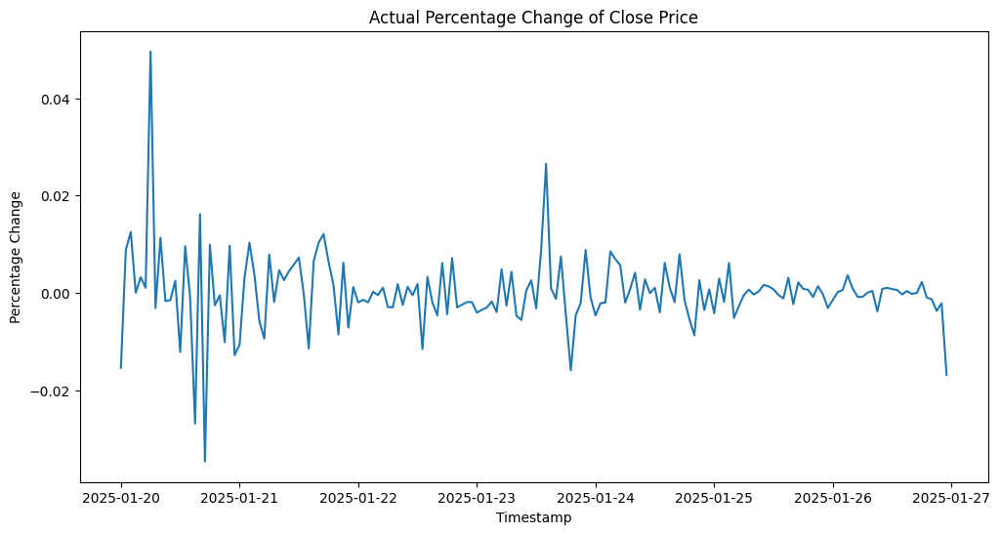

In [241]:
plt.figure(figsize=(12, 6))
plt.plot(btcusd_Dataframe_Segmented['Close_pct_change'].iloc[82800:])
plt.title('Actual Percentage Change of Close Price')
plt.xlabel('Timestamp')
plt.ylabel('Percentage Change')
plt.show()

Observing the above, this looks like white gaussian noise or some completely random series. However, as a trader, this is what I am interested in. To forecast the delta whether it is absolute price or percentage. For this task, I opted for a percentage because it somehow makes the time series independent of the absolute scale and makes it more or less stationary.

In literature, I have observed people taking min/max scaling, log transformations etc. But if we look at the BTC price, it's an ever increasing trend. And min max scaling is irrelevant because with every new day, the scaling would need to be performed again which might not be a nice thing to have. Similarly, with the underlying distribution changes with ever increasing prices especially during a bull trend, it would be desirable to work with percentage changes only.

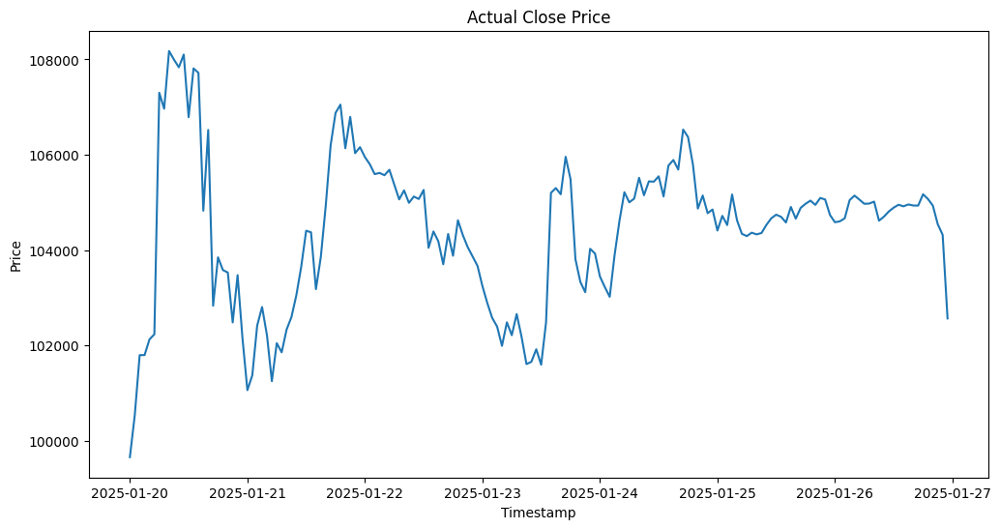

In [242]:
plt.figure(figsize=(12, 6))
plt.plot(btcusd_Dataframe_Segmented['Close'].iloc[82800:])
plt.title('Actual Close Price')
plt.xlabel('Timestamp')
plt.ylabel('Price')
plt.show()

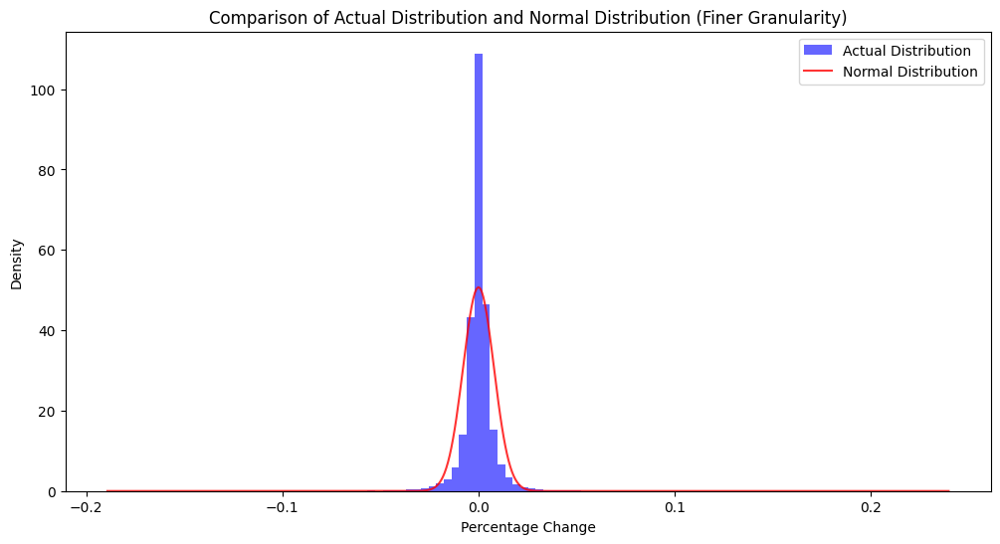

In [243]:
plt.figure(figsize=(12, 6))

plt.hist(
    btcusd_Dataframe_Segmented['Close_pct_change'],
    bins=100,
    density=True,
    alpha=0.6,
    color='blue',
    label='Actual Distribution'
)

mean = btcusd_Dataframe_Segmented['Close_pct_change'].mean()
std = btcusd_Dataframe_Segmented['Close_pct_change'].std()

xmin, xmax = plt.xlim()

x = np.linspace(xmin, xmax, 500)
p = norm.pdf(x, loc=mean, scale=std)

plt.plot(x, p, 'r', alpha=0.8, label='Normal Distribution')

plt.title('Comparison of Actual Distribution and Normal Distribution (Finer Granularity)')
plt.xlabel('Percentage Change')
plt.ylabel('Density')
plt.legend()
plt.show()

Observing above, we see two noticable things:

1. The price for the next immediate time index, will most likely remain similar in most of the case. I.e market continues its momentum.

2. We have long tails of our percentage change distribution indicating strong moves in the direction of the trend (bearish or bullish) when we have a catalyst in the market.

To prepare the data, first let's do one hot encoding for the segmentation

In [244]:
btcusd_Dataframe_Segmented = pd.get_dummies(btcusd_Dataframe_Segmented, columns=['Segmentation'], prefix='Seg', dtype=int)

In [406]:
btcusd_Dataframe_Segmented.to_csv('btcusd_Raw_Dataframe_Segmented.csv', index=True)

In [425]:
btcusd_Dataframe_Segmented = pd.read_csv('btcusd_Raw_Dataframe_Segmented.csv',index_col="Timestamp")

In [426]:
btcusd_Dataframe_Segmented.head()

,Low,High,Open,Close,Volume,Low_pct_change,High_pct_change,Open_pct_change,Close_pct_change,Seg_Broad Bear Channel,Seg_Range,Seg_Tight Bear Channel,Seg_Tight Bull Channel
Timestamp,,,,,,,,,,,,,
2015-07-22 00:00:00,277.32,277.79,277.33,277.79,228.666569,0.001698,-0.001402,-0.002661,0.001695,0,1,0,0
2015-07-22 01:00:00,276.48,278.30,277.79,276.61,209.028523,-0.003029,0.001836,0.001659,-0.004248,0,1,0,0
2015-07-22 02:00:00,276.01,276.89,276.56,276.42,166.841611,-0.001700,-0.005066,-0.004428,-0.000687,0,1,0,0
2015-07-22 03:00:00,276.21,277.16,276.58,276.91,241.774294,0.000725,0.000975,0.000072,0.001773,0,1,0,0
2015-07-22 04:00:00,276.31,276.95,276.85,276.40,171.778578,0.000362,-0.000758,0.000976,-0.001842,0,1,0,0


Add indicators for introducing some temporal dependence

In [428]:
btcusd_Dataframe_Segmented['MA20'] = btcusd_Dataframe_Segmented['Close'].rolling(window=24).mean()
btcusd_Dataframe_Segmented['MA50'] = btcusd_Dataframe_Segmented['Close'].rolling(window=24).mean()

btcusd_Dataframe_Segmented['RSI'] = ta.rsi(btcusd_Dataframe_Segmented['Close'], length=24)

btcusd_Dataframe_Segmented['ATR'] = ta.atr(btcusd_Dataframe_Segmented['High'], btcusd_Dataframe_Segmented['Low'], btcusd_Dataframe_Segmented['Close'], length=24)

In [429]:
btcusd_Dataframe_Segmented = btcusd_Dataframe_Segmented.iloc[24:]

In [430]:
btcusd_Dataframe_Segmented.head()

,Low,High,Open,Close,Volume,Low_pct_change,High_pct_change,Open_pct_change,Close_pct_change,Seg_Broad Bear Channel,Seg_Range,Seg_Tight Bear Channel,Seg_Tight Bull Channel,MA20,MA50,RSI,ATR
Timestamp,,,,,,,,,,,,,,,,,
2015-07-23 00:00:00,277.91,278.26,277.96,278.16,167.759256,0.002164,0.001079,0.002344,0.000972,0,1,0,0,277.040417,277.040417,55.306037,0.904308
2015-07-23 01:00:00,277.93,278.74,278.13,278.74,216.554181,0.000072,0.001725,0.000612,0.002085,0,1,0,0,277.129167,277.129167,58.614513,0.898308
2015-07-23 02:00:00,278.65,279.75,278.65,279.06,447.191939,0.002591,0.003623,0.001870,0.001148,0,1,0,0,277.239167,277.239167,60.306152,0.910864
2015-07-23 03:00:00,277.73,279.18,279.06,277.89,177.493416,-0.003302,-0.002038,0.001471,-0.004193,0,1,0,0,277.280000,277.280000,52.170313,0.943750
2015-07-23 04:00:00,277.79,278.62,277.88,278.31,125.401060,0.000216,-0.002006,-0.004228,0.001511,0,1,0,0,277.359583,277.359583,54.471091,0.936943


In [431]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['Low', 'High', 'Open', 'Close', 'Volume', 'Low_pct_change', 'High_pct_change',
                   'Open_pct_change', 'Close_pct_change', 'MA20', 'MA50', 'RSI', 'ATR']

scaler = StandardScaler()

btcusd_Dataframe_Segmented[columns_to_scale] = scaler.fit_transform(btcusd_Dataframe_Segmented[columns_to_scale])

btcusd_Dataframe_Segmented.head()

,Low,High,Open,Close,Volume,Low_pct_change,High_pct_change,Open_pct_change,Close_pct_change,Seg_Broad Bear Channel,Seg_Range,Seg_Tight Bear Channel,Seg_Tight Bull Channel,MA20,MA50,RSI,ATR
Timestamp,,,,,,,,,,,,,,,,,
2015-07-23 00:00:00,-0.932111,-0.932819,-0.932520,-0.932502,-0.565013,0.240564,0.138916,0.285550,0.110488,0,1,0,0,-0.932837,-0.932837,0.410304,-0.833799
2015-07-23 01:00:00,-0.932111,-0.932798,-0.932513,-0.932477,-0.501478,-0.004239,0.230173,0.064872,0.252011,0,1,0,0,-0.932833,-0.932833,0.743006,-0.833824
2015-07-23 02:00:00,-0.932079,-0.932755,-0.932490,-0.932463,-0.201166,0.290532,0.498474,0.225128,0.132910,0,1,0,0,-0.932829,-0.932829,0.913118,-0.833773
2015-07-23 03:00:00,-0.932119,-0.932779,-0.932473,-0.932514,-0.552338,-0.399075,-0.301575,0.174396,-0.545858,0,1,0,0,-0.932827,-0.932827,0.094973,-0.833639
2015-07-23 04:00:00,-0.932117,-0.932803,-0.932524,-0.932496,-0.620168,0.012622,-0.297101,-0.551689,0.179092,0,1,0,0,-0.932823,-0.932823,0.326341,-0.833667


In [437]:
btcusd_Dataframe_Segmented.shape

(82944, 17)

In [475]:
segmentation_counts = btcusd_Dataframe_Segmented.filter(regex='^Seg_').sum()
segmentation_counts

,0
Seg_Broad Bear Channel,48
Seg_Range,51000
Seg_Tight Bear Channel,14304
Seg_Tight Bull Channel,17592


Granularity for 1 day

In [438]:
def prepare_lstm_dataset(df, look_back=48):
    total_rows = len(df)
    full_days = total_rows // 24
    df = df.iloc[: full_days * 24]  # keep only complete days
    seg_cols = [col for col in df.columns if col.startswith('Seg_')]
    input_cols = [col for col in df.columns if col not in seg_cols]
    pct_change_cols = [
        'Low_pct_change', 'High_pct_change',
        'Open_pct_change', 'Close_pct_change'
    ]
    input_data = df[input_cols].values  # shape: (total_hours, num_input_feats)

    pct_change_data = df[pct_change_cols].values

    seg_data = df[seg_cols].values

    horizon = 24
    num_input_feats  = input_data.shape[1]     # all features except 'Seg_'
    num_pct_feats    = pct_change_data.shape[1]  # should be 4
    num_seg_classes  = seg_data.shape[1]

    num_samples = len(range(0, len(df) - (look_back + horizon) + 1, 24))

    X_forecasting  = np.empty((num_samples, look_back,  num_input_feats), dtype=np.float32)
    X_segmentation = np.empty((num_samples, horizon,    num_input_feats), dtype=np.float32)
    Y_forecasting  = np.empty((num_samples, horizon,    num_pct_feats),  dtype=np.float32)
    Y_segmentation = np.empty((num_samples, num_seg_classes),           dtype=np.float32)

    sample_idx = 0

    for start_idx in range(0, len(df) - (look_back + horizon) + 1, 24):
        X_forecasting[sample_idx] = input_data[start_idx : start_idx + look_back]

        X_segmentation[sample_idx] = input_data[start_idx + look_back : start_idx + look_back + horizon]

        Y_forecasting[sample_idx] = pct_change_data[start_idx + look_back : start_idx + look_back + horizon]

        Y_segmentation[sample_idx] = seg_data[start_idx + look_back + horizon - 1]

        sample_idx += 1

    return X_forecasting, X_segmentation, Y_forecasting, Y_segmentation

In [439]:
X_forecasting, X_segmentation, Y_forecasting, Y_segmentation = prepare_lstm_dataset(btcusd_Dataframe_Segmented,48)

In [441]:
print(X_forecasting.shape)
print(Y_forecasting.shape)
print(X_segmentation.shape)
print(Y_segmentation.shape)

(3454, 48, 13)
(3454, 24, 4)
(3454, 24, 13)
(3454, 4)


So, now, we have the correct pre-processing. Based upon the previous 48 candle stick data i.e 2 days, I will be trying to predict the pattern for the next 24 candle sticks i.e 1 day.

For segmentation, we have the same, 4 classes with one hot encoded vectors.

Now, we can perform the train test split

In [442]:
train_size = int(0.8 * len(X_forecasting))
val_size = int(0.1 * len(X_forecasting))
test_size = len(X_forecasting) - train_size - val_size

X_train_forecast, X_val_forecast, X_test_forecast = X_forecasting[:train_size], X_forecasting[train_size:train_size + val_size], X_forecasting[train_size + val_size:]
X_train_segment, X_val_segment, X_test_segment = X_segmentation[:train_size], X_segmentation[train_size:train_size + val_size], X_segmentation[train_size + val_size:]
Y_train_forecast, Y_val_forecast, Y_test_forecast = Y_forecasting[:train_size], Y_forecasting[train_size:train_size + val_size], Y_forecasting[train_size + val_size:]
Y_train_segment, Y_val_segment, Y_test_segment = Y_segmentation[:train_size], Y_segmentation[train_size:train_size + val_size], Y_segmentation[train_size + val_size:]

In [443]:
print(X_train_forecast.shape)
print(Y_train_forecast.shape)
print(X_train_segment.shape)
print(Y_train_segment.shape)
print(X_val_forecast.shape)
print(Y_val_forecast.shape)
print(X_val_segment.shape)
print(Y_val_segment.shape)
print(X_test_forecast.shape)
print(Y_test_forecast.shape)
print(X_test_segment.shape)
print(Y_test_segment.shape)

(2763, 48, 13)
(2763, 24, 4)
(2763, 24, 13)
(2763, 4)
(345, 48, 13)
(345, 24, 4)
(345, 24, 13)
(345, 4)
(346, 48, 13)
(346, 24, 4)
(346, 24, 13)
(346, 4)


## Model Architecture & Training

In [504]:
import tensorflow as tf
from tensorflow.keras.layers import (Input, Conv1D, LSTM, Dense, Reshape, Bidirectional,Layer)
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K

huber_loss = tf.keras.losses.Huber(
    delta=1.0,  # Threshold where MAE takes over from MSE
    reduction='sum_over_batch_size',  # Default reduction
    name='huber_loss')

def r2_metric(y_true, y_pred):
  """
  Custom R² metric for Keras models.
  """
  ss_res = K.sum(K.square(y_true - y_pred))
  ss_tot = K.sum(K.square(y_true - K.mean(y_true)))
  r2 = 1 - ss_res / (ss_tot + K.epsilon())
  return r2

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)), axis=0)
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)), axis=0)
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
  true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)),axis=0)
  predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)),axis=0)
  precision = true_positives / (predicted_positives + K.epsilon())
  return precision

def f1_m(y_true, y_pred):
  precision = precision_m(y_true, y_pred)
  recall = recall_m(y_true, y_pred)
  return 2*((precision*recall)/(precision+recall+K.epsilon()))

#### Basic Forecasting Model

In [519]:
def create_forecasting_model(look_back=48, num_features=13, horizon=24):

    inp = Input(shape=(look_back, num_features), name="input_forecast")

    x = LSTM(32, return_sequences=True, name="lstm_forecasting")(inp)
    x = LSTM(16, return_sequences=True, name="lstm_forecasting_2")(x)
    x = LSTM(8, return_sequences=False, name="lstm_forecasting_3")(x)
    x = Dense(8, activation='relu', name="dense_forecast")(x)

    x = Dense(horizon * 4, activation='linear', name='dense_forecast_out')(x)
    forecast_out = Reshape((horizon, 4), name='forecast_output')(x)

    model = Model(inputs=inp, outputs=forecast_out)
    model.compile(
        optimizer='adam',
        loss=huber_loss,
        metrics=['mae','mse',r2_metric]
    )

    model.summary()
    return model

In [522]:
base_forecasting_model = create_forecasting_model(48)

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_forecast (InputLayer)          │ (None, 48, 13)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_forecasting (LSTM)              │ (None, 48, 32)              │           5,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_forecasting_2 (LSTM)            │ (None, 48, 16)              │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_forecasting_3 (LSTM)            │ (None, 8)                   │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_forecast (Dense)               │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_forecast_out (Dense)           │ (None, 96)                  │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ forecast_output (Reshape)            │ (None, 24, 4)               │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,760 (42.03 KB)

 Trainable params: 10,760 (42.03 KB)

 Non-trainable params: 0 (0.00 B)

In [523]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=50,
    restore_best_weights=True
)

base_forecasting_model_history = base_forecasting_model.fit(
    X_train_forecast,
    Y_train_forecast,
    validation_data=(X_val_forecast,Y_val_forecast),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping]
)

Epoch 1/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.3131 - mae: 0.5854 - mse: 1.1028 - r2_metric: -0.0016 - val_loss: 0.1322 - val_mae: 0.3481 - val_mse: 0.3605 - val_r2_metric: -0.0018
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.3157 - mae: 0.5883 - mse: 1.1462 - r2_metric: 5.3523e-05 - val_loss: 0.1322 - val_mae: 0.3482 - val_mse: 0.3607 - val_r2_metric: -0.0027
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.3130 - mae: 0.5864 - mse: 1.1170 - r2_metric: 1.2656e-04 - val_loss: 0.1323 - val_mae: 0.3484 - val_mse: 0.3610 - val_r2_metric: -0.0036
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.3309 - mae: 0.6070 - mse: 1.2459 - r2_metric: 8.2837e-05 - val_loss: 0.1323 - val_mae: 0.3485 - val_mse: 0.3610 - val_r2_metric: -0.0039
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.3091 - mae: 0.5820 - mse: 1.1040 - r2_metric: 6.0462e-04 - val_loss: 0.1323 - val_mae: 0.3485 - val_mse: 0.3611 - val_r2_metric: -0.0041
Epoch 6/

In [524]:
test_loss_forecast = base_forecasting_model.evaluate(X_test_forecast, Y_test_forecast)
print("Forecast model test loss and metrics:", test_loss_forecast)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2118 - mae: 0.4774 - mse: 0.5614 - r2_metric: -0.0012
Forecast model test loss and metrics: [0.19522085785865784, 0.4548532962799072, 0.506981372833252, -0.0016615986824035645]


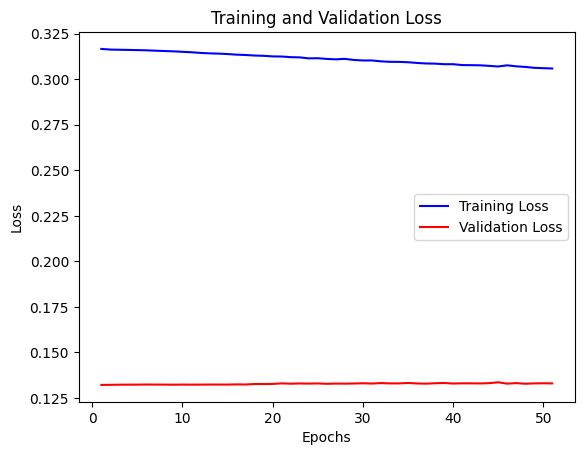

In [525]:
train_loss = base_forecasting_model_history.history['loss']
val_loss = base_forecasting_model_history.history['val_loss']

epochs = range(1, len(train_loss) + 1)

plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


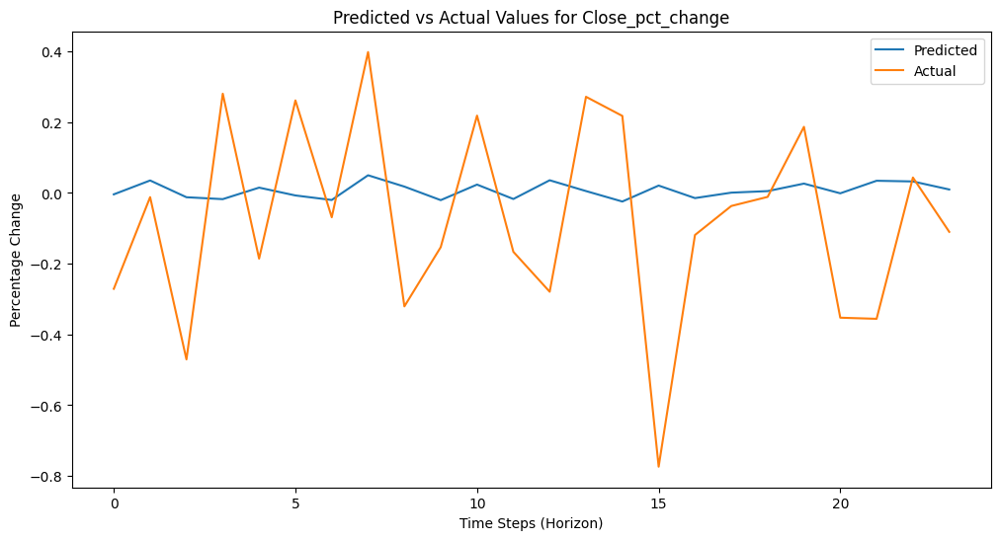

In [526]:
pred_forecast = base_forecasting_model.predict(X_test_forecast)

sample_index = 100

feature_index = 3  # Index corresponding to 'Close_pct_change'

predicted_values = pred_forecast[sample_index, :, feature_index]
actual_values = Y_test_forecast[sample_index, :, feature_index]

plt.figure(figsize=(12, 6))
plt.plot(predicted_values, label='Predicted')
plt.plot(actual_values, label='Actual')
plt.title('Predicted vs Actual Values for Close_pct_change')
plt.xlabel('Time Steps (Horizon)')
plt.ylabel('Percentage Change')
plt.legend()
plt.show()

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


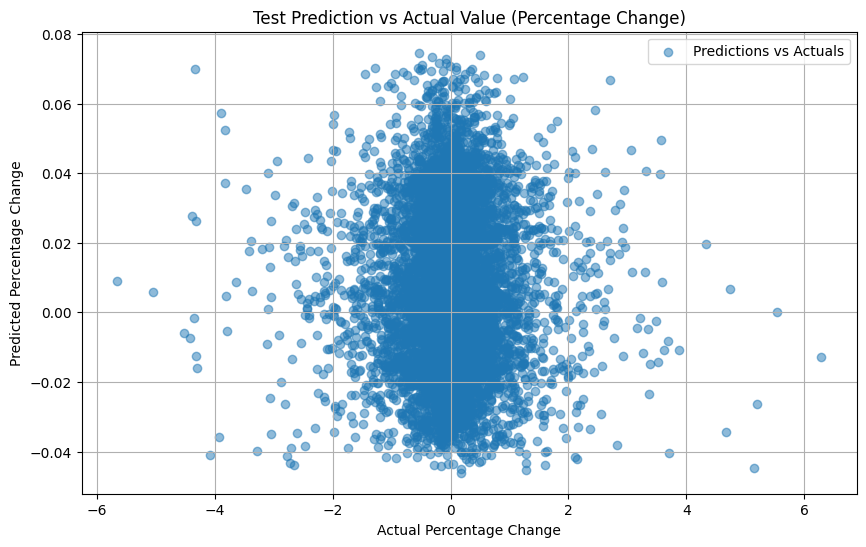

In [527]:
predictions = base_forecasting_model.predict(X_test_forecast)

actual_close_pct_change = Y_test_forecast[:, :, 3]  # Shape: [batch_size, prediction_horizon]
predicted_close_pct_change = predictions[:, :, 3]  # Shape: [batch_size, prediction_horizon]

actual_close_pct_change_flat = actual_close_pct_change.flatten()
predicted_close_pct_change_flat = predicted_close_pct_change.flatten()

plt.figure(figsize=(10, 6))
plt.scatter(
    actual_close_pct_change_flat,
    predicted_close_pct_change_flat,
    alpha=0.5,
    label="Predictions vs Actuals"
)
plt.xlabel("Actual Percentage Change")
plt.ylabel("Predicted Percentage Change")
plt.title("Test Prediction vs Actual Value (Percentage Change)")
plt.grid(True)
plt.legend()
plt.show()

#### A CNN-LSTM Attempt

In [528]:
def create_forecasting_model_cnn_lstm(look_back=48, num_features=13, horizon=24):
    inp = Input(shape=(look_back, num_features), name="input_forecast")
    x = Conv1D(filters=16, kernel_size=3, padding='same', activation='relu')(inp)
    x = Conv1D(filters=8, kernel_size=3, padding='same', activation='relu')(x)

    x = LSTM(32, return_sequences=True)(x)   # pass the entire sequence
    x = LSTM(16, return_sequences=True)(x)   # pass the entire sequence
    x = LSTM(8, return_sequences=True)(x)  # return the sequence
    x = LSTM(8, return_sequences=False)(x)  # return the final hidden state

    x = Dense(16, activation='relu')(x)

    x = Dense(horizon * 4, activation='linear', name='dense_forecast_out')(x)
    forecast_out = Reshape((horizon, 4), name='forecast_output')(x)

    model = Model(inputs=inp, outputs=forecast_out)
    model.compile(
        optimizer='adam',
        loss=huber_loss,
        metrics=['mae', 'mse', r2_metric]
    )

    model.summary()
    return model

In [529]:
cnnlstm_forecasting_model = create_forecasting_model_cnn_lstm()

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_forecast (InputLayer)          │ (None, 48, 13)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_4 (Conv1D)                    │ (None, 48, 16)              │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_5 (Conv1D)                    │ (None, 48, 8)               │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_40 (LSTM)                       │ (None, 48, 32)              │           5,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_41 (LSTM)                       │ (None, 48, 16)              │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_42 (LSTM)                       │ (None, 48, 8)               │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_43 (LSTM)                       │ (None, 8)                   │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_forecast_out (Dense)           │ (None, 96)                  │           1,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ forecast_output (Reshape)            │ (None, 24, 4)               │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,536 (48.97 KB)

 Trainable params: 12,536 (48.97 KB)

 Non-trainable params: 0 (0.00 B)

In [530]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=50,
    restore_best_weights=True
)

cnnlstm_forecasting_model_history = cnnlstm_forecasting_model.fit(
    X_train_forecast,
    Y_train_forecast,
    validation_data=(X_val_forecast,Y_val_forecast),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping]
)

Epoch 1/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.3219 - mae: 0.5971 - mse: 1.1698 - r2_metric: -9.6880e-04 - val_loss: 0.1321 - val_mae: 0.3480 - val_mse: 0.3603 - val_r2_metric: -0.0015
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.3280 - mae: 0.6036 - mse: 1.1983 - r2_metric: -1.8319e-04 - val_loss: 0.1322 - val_mae: 0.3483 - val_mse: 0.3608 - val_r2_metric: -0.0031
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3101 - mae: 0.5832 - mse: 1.0805 - r2_metric: 2.1764e-04 - val_loss: 0.1324 - val_mae: 0.3485 - val_mse: 0.3611 - val_r2_metric: -0.0042
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3126 - mae: 0.5873 - mse: 1.0905 - r2_metric: -1.1796e-04 - val_loss: 0.1323 - val_mae: 0.3482 - val_mse: 0.3608 - val_r2_metric: -0.0033
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3167 - mae: 0.5921 - mse: 1.1330 - r2_metric: 7.6314e-04 - val_loss: 0.1323 - val_mae: 0.3482 - val_mse: 0.3609 - val_r2_metric: -0.0035
Ep

In [531]:
test_loss_forecast = cnnlstm_forecasting_model.evaluate(X_test_forecast, Y_test_forecast)
print("Forecast model test loss and metrics:", test_loss_forecast)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2116 - mae: 0.4770 - mse: 0.5610 - r2_metric: -2.4063e-04
Forecast model test loss and metrics: [0.19511114060878754, 0.45454224944114685, 0.506675660610199, -0.0008806206751614809]


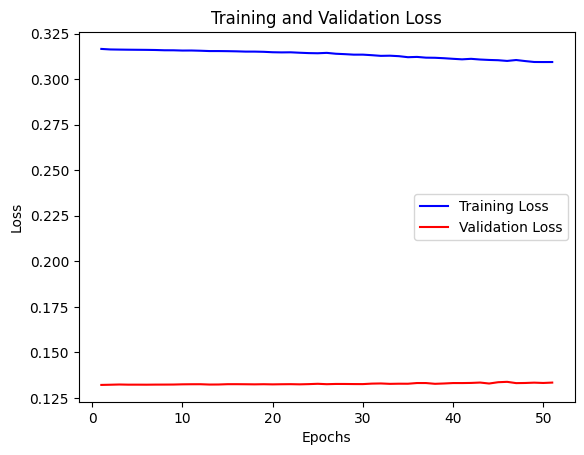

In [532]:
train_loss = cnnlstm_forecasting_model_history.history['loss']
val_loss = cnnlstm_forecasting_model_history.history['val_loss']

epochs = range(1, len(train_loss) + 1)

plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step


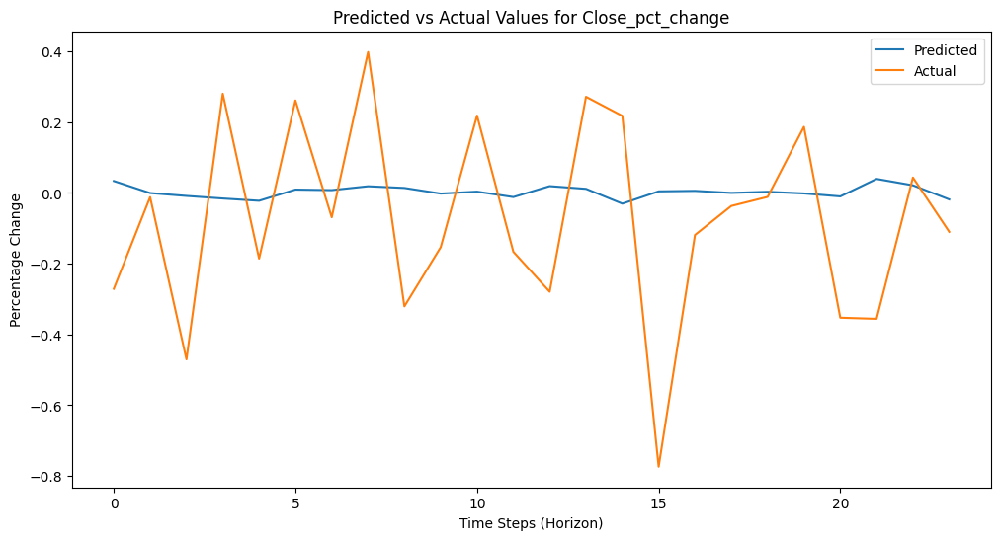

In [533]:
pred_forecast = cnnlstm_forecasting_model.predict(X_test_forecast)

sample_index = 100

feature_index = 3  # Index corresponding to 'Close_pct_change'

predicted_values = pred_forecast[sample_index, :, feature_index]
actual_values = Y_test_forecast[sample_index, :, feature_index]

plt.figure(figsize=(12, 6))
plt.plot(predicted_values, label='Predicted')
plt.plot(actual_values, label='Actual')
plt.title('Predicted vs Actual Values for Close_pct_change')
plt.xlabel('Time Steps (Horizon)')
plt.ylabel('Percentage Change')
plt.legend()
plt.show()

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


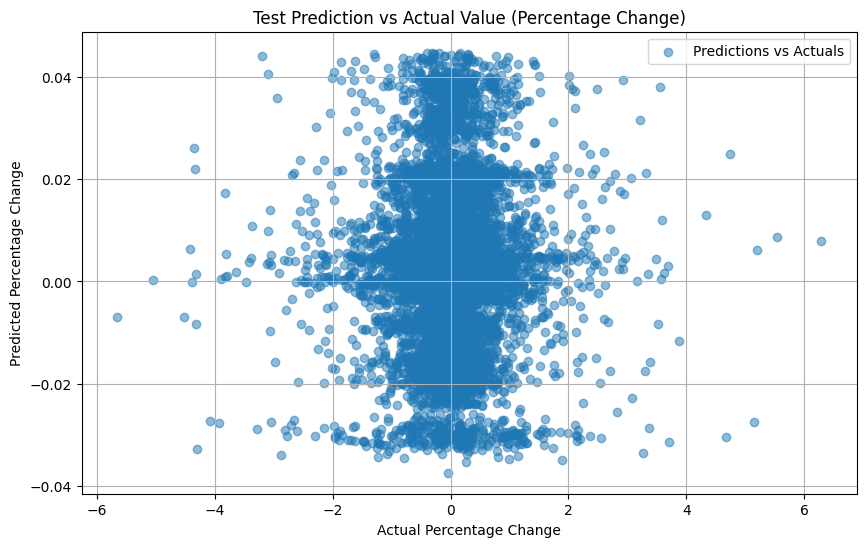

In [534]:
predictions = cnnlstm_forecasting_model.predict(X_test_forecast)

actual_close_pct_change = Y_test_forecast[:, :, 3]  # Shape: [batch_size, prediction_horizon]
predicted_close_pct_change = predictions[:, :, 3]  # Shape: [batch_size, prediction_horizon]

actual_close_pct_change_flat = actual_close_pct_change.flatten()
predicted_close_pct_change_flat = predicted_close_pct_change.flatten()

plt.figure(figsize=(10, 6))
plt.scatter(
    actual_close_pct_change_flat,
    predicted_close_pct_change_flat,
    alpha=0.5,
    label="Predictions vs Actuals"
)
plt.xlabel("Actual Percentage Change")
plt.ylabel("Predicted Percentage Change")
plt.title("Test Prediction vs Actual Value (Percentage Change)")
plt.grid(True)
plt.legend()
plt.show()

####Attention Based LSTM Architecture

In [535]:
class BahdanauAttention(Layer):
    """
    Bahdanau Attention:
     - score(h_s, h_t) = v^T * tanh(W_e*h_s + W_d*h_t)
       where h_s is each encoder (LSTM) hidden state at time s,
             h_t is the 'query' (in this case, the final hidden state).
    """
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W_e = Dense(units)
        self.W_d = Dense(units)
        self.V   = Dense(1)

    def call(self, encoder_outputs, query_state):
        """
        encoder_outputs: (batch_size, timesteps, enc_units)
        query_state:     (batch_size, enc_units)
                         Typically the final hidden state of LSTM or some other 'query'.

        Returns:
        --------
          context_vector:   (batch_size, enc_units)
          attention_weights:(batch_size, timesteps, 1)
        """
        query_state_expanded = tf.expand_dims(query_state, 1)

        score = self.V(tf.nn.tanh(
            self.W_e(encoder_outputs) + self.W_d(query_state_expanded)
        ))

        attention_weights = tf.nn.softmax(score, axis=1)
        context_vector = attention_weights * encoder_outputs
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights


def create_attention_lstm_model(
    timesteps=48,    # length of your input sequence
    features=13,     # number of features at each timestep
    lstm_units=64,
    attention_units=32,
    horizon=24,      # how many future steps to predict
    out_dim=4        # number of features to predict at each step
):

    inp = Input(shape=(timesteps, features), name='input_series')

    lstm_out = LSTM(lstm_units, return_sequences=True)(inp)
    lstm_out = LSTM(32, return_sequences=True)(lstm_out)
    lstm_out = LSTM(16, return_sequences=True)(lstm_out)

    final_hidden_state = lstm_out[:, -1, :]

    attention_layer = BahdanauAttention(attention_units)
    context_vector, attention_weights = attention_layer(lstm_out, final_hidden_state)

    x = Dense(horizon * out_dim, activation='linear')(context_vector)

    forecast_out = Reshape((horizon, out_dim))(x)

    model = Model(inputs=inp, outputs=forecast_out, name='attention_lstm_forecast')

    model.compile(
        optimizer='adam',
        loss=huber_loss,
        metrics=['mae', 'mse', r2_metric]
    )

    model.summary()
    return model

In [536]:
lstm_attention_model = create_attention_lstm_model()

Model: "attention_lstm_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_series (InputLayer) │ (None, 48, 13)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_44 (LSTM)            │ (None, 48, 64)         │         19,968 │ input_series[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_45 (LSTM)            │ (None, 48, 32)         │         12,416 │ lstm_44[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_46 (LSTM)            │ (None, 48, 16)         │          3,136 │ lstm_45[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item_1 (GetItem)      │ (None, 16)             │              0 │ lstm_46[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bahdanau_attention_3      │ [(None, 16), (None,    │          1,121 │ lstm_46[0][0],         │
│ (BahdanauAttention)       │ 48, 1)]                │                │ get_item_1[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 96)             │          1,632 │ bahdanau_attention_3[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_6 (Reshape)       │ (None, 24, 4)          │              0 │ dense_26[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 38,273 (149.50 KB)

 Trainable params: 38,273 (149.50 KB)

 Non-trainable params: 0 (0.00 B)

In [537]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=50,
    restore_best_weights=True
)

lstm_attention_model_history = lstm_attention_model.fit(
    X_train_forecast,
    Y_train_forecast,
    validation_data=(X_val_forecast,Y_val_forecast),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping]
)

Epoch 1/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - loss: 0.3206 - mae: 0.5960 - mse: 1.1494 - r2_metric: -0.0011 - val_loss: 0.1323 - val_mae: 0.3482 - val_mse: 0.3606 - val_r2_metric: -0.0022
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.3171 - mae: 0.5895 - mse: 1.1748 - r2_metric: -3.8966e-04 - val_loss: 0.1323 - val_mae: 0.3484 - val_mse: 0.3609 - val_r2_metric: -0.0030
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.3203 - mae: 0.5948 - mse: 1.1967 - r2_metric: -7.3308e-05 - val_loss: 0.1325 - val_mae: 0.3487 - val_mse: 0.3612 - val_r2_metric: -0.0043
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.3035 - mae: 0.5758 - mse: 1.0303 - r2_metric: 0.0010 - val_loss: 0.1325 - val_mae: 0.3486 - val_mse: 0.3613 - val_r2_metric: -0.0044
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.3197 - mae: 0.5931 - mse: 1.1865 - r2_metric: 9.9222e-04 - val_loss: 0.1326 - val_mae: 0.3491 - val_mse: 0.3616 - val_r2_metric: -0.0051
Epoch 6/10

In [538]:
test_loss_forecast = lstm_attention_model.evaluate(X_test_forecast, Y_test_forecast)
print("Forecast model test loss and metrics:", test_loss_forecast)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2120 - mae: 0.4778 - mse: 0.5618 - r2_metric: -0.0022
Forecast model test loss and metrics: [0.19574807584285736, 0.4560180902481079, 0.5080631971359253, -0.004293279256671667]


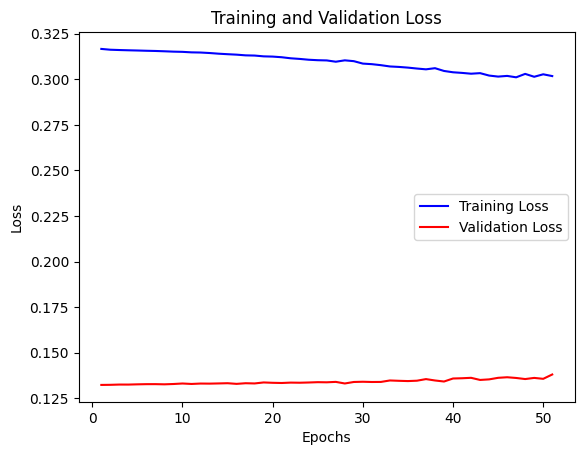

In [539]:
train_loss = lstm_attention_model_history.history['loss']
val_loss = lstm_attention_model_history.history['val_loss']

epochs = range(1, len(train_loss) + 1)

plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step


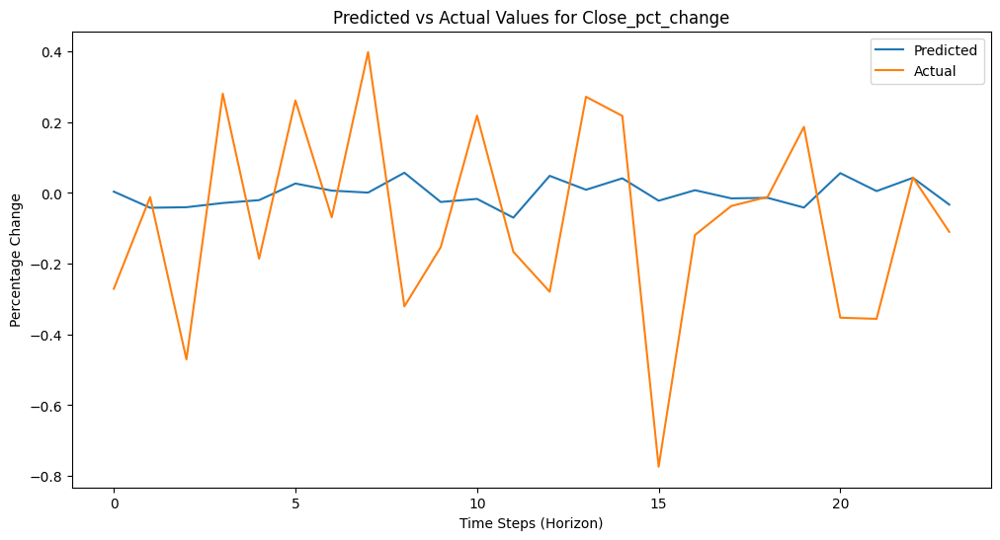

In [540]:
pred_forecast = lstm_attention_model.predict(X_test_forecast)

sample_index = 100

feature_index = 3  # Index corresponding to 'Close_pct_change'

predicted_values = pred_forecast[sample_index, :, feature_index]
actual_values = Y_test_forecast[sample_index, :, feature_index]

plt.figure(figsize=(12, 6))
plt.plot(predicted_values, label='Predicted')
plt.plot(actual_values, label='Actual')
plt.title('Predicted vs Actual Values for Close_pct_change')
plt.xlabel('Time Steps (Horizon)')
plt.ylabel('Percentage Change')
plt.legend()
plt.show()

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


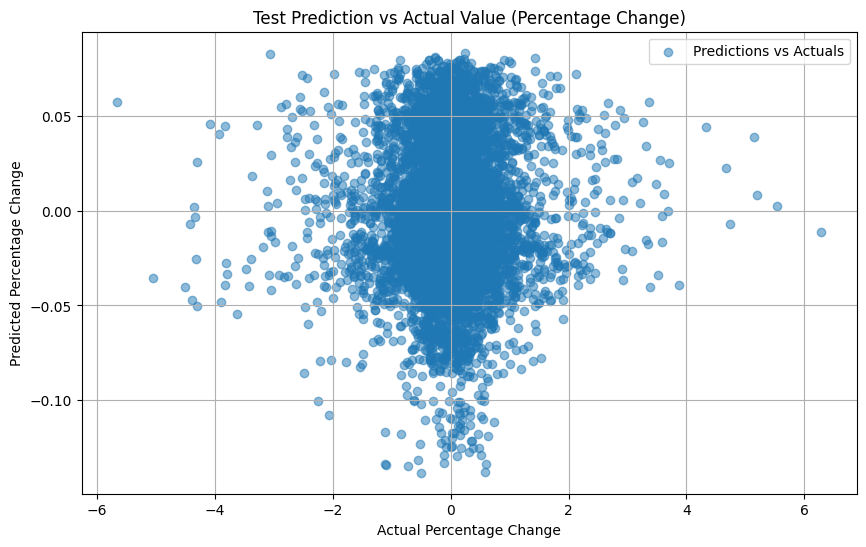

In [541]:
predictions = lstm_attention_model.predict(X_test_forecast)

actual_close_pct_change = Y_test_forecast[:, :, 3]  # Shape: [batch_size, prediction_horizon]
predicted_close_pct_change = predictions[:, :, 3]  # Shape: [batch_size, prediction_horizon]

actual_close_pct_change_flat = actual_close_pct_change.flatten()
predicted_close_pct_change_flat = predicted_close_pct_change.flatten()

plt.figure(figsize=(10, 6))
plt.scatter(
    actual_close_pct_change_flat,
    predicted_close_pct_change_flat,
    alpha=0.5,
    label="Predictions vs Actuals"
)
plt.xlabel("Actual Percentage Change")
plt.ylabel("Predicted Percentage Change")
plt.title("Test Prediction vs Actual Value (Percentage Change)")
plt.grid(True)
plt.legend()
plt.show()

#### Basic Segmentation Model

In [542]:
def create_segmentation_model(look_back=24, num_features=13, num_classes=4):
    inp = Input(shape=(look_back, num_features), name="input_segmentation")

    x = LSTM(64, return_sequences=True, name="lstm_segmentation")(inp)
    x = LSTM(32, return_sequences=True, name="lstm_segmentation_2")(x)
    x = LSTM(16, return_sequences=False, name="lstm_segmentation_3")(x)
    x = Dense(8, activation='relu', name="dense_segmentation")(x)

    class_out = Dense(num_classes, activation='softmax', name='class_output')(x)

    model = Model(inputs=inp, outputs=class_out)
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy',precision_m,recall_m,f1_m]
    )

    model.summary()
    return model

In [543]:
base_segmentation_model = create_segmentation_model()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_segmentation (InputLayer)      │ (None, 24, 13)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_segmentation (LSTM)             │ (None, 24, 64)              │          19,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_segmentation_2 (LSTM)           │ (None, 24, 32)              │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_segmentation_3 (LSTM)           │ (None, 16)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_segmentation (Dense)           │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ class_output (Dense)                 │ (None, 4)                   │              36 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 35,692 (139.42 KB)

 Trainable params: 35,692 (139.42 KB)

 Non-trainable params: 0 (0.00 B)

In [545]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=50,
    restore_best_weights=True
)

base_segmentation_model_history = base_segmentation_model.fit(
    X_train_segment,
    Y_train_segment,
    validation_data=(X_val_segment,Y_val_segment),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping]
)

Epoch 1/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8992 - f1_m: 0.6576 - loss: 0.2518 - precision_m: 0.6703 - recall_m: 0.6569 - val_accuracy: 0.9536 - val_f1_m: 0.6708 - val_loss: 0.1514 - val_precision_m: 0.6832 - val_recall_m: 0.6718
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9167 - f1_m: 0.6692 - loss: 0.2212 - precision_m: 0.6805 - recall_m: 0.6727 - val_accuracy: 0.9304 - val_f1_m: 0.6472 - val_loss: 0.1789 - val_precision_m: 0.6389 - val_recall_m: 0.6767
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9161 - f1_m: 0.6735 - loss: 0.2057 - precision_m: 0.6862 - recall_m: 0.6754 - val_accuracy: 0.9333 - val_f1_m: 0.6393 - val_loss: 0.1622 - val_precision_m: 0.6550 - val_recall_m: 0.6347
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9417 - f1_m: 0.6994 - loss: 0.1639 - precision_m: 0.7061 - recall_m: 0.6998 - val_accuracy: 0.9246 - val_f1_m: 0.6271 - val_loss: 0.1635 - val_precision_m: 0.6553 - val_recall_m: 0

#### Bi-directional LSTM

In [546]:
def create_segmentation_model_bidirection(look_back=24, num_features=13, num_classes=4):
    inp = Input(shape=(look_back, num_features), name="input_segmentation")
    x = Bidirectional(LSTM(64, return_sequences=True),name="bilstm_segmentation_1")(inp)

    x = Bidirectional(LSTM(32, return_sequences=True),name="bilstm_segmentation_2")(x)

    x = Bidirectional(LSTM(16, return_sequences=False),name="bilstm_segmentation_3")(x)

    x = Dense(16, activation='relu', name="dense_segmentation")(x)

    class_out = Dense(num_classes, activation='softmax', name='class_output')(x)

    model = Model(inputs=inp, outputs=class_out)
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy',precision_m, recall_m, f1_m]
    )

    model.summary()
    return model

In [547]:
bidirection_segmentation_model = create_segmentation_model_bidirection()

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_segmentation (InputLayer)      │ (None, 24, 13)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bilstm_segmentation_1                │ (None, 24, 128)             │          39,936 │
│ (Bidirectional)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bilstm_segmentation_2                │ (None, 24, 64)              │          41,216 │
│ (Bidirectional)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bilstm_segmentation_3                │ (None, 32)                  │          10,368 │
│ (Bidirectional)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_segmentation (Dense)           │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ class_output (Dense)                 │ (None, 4)                   │              68 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 92,116 (359.83 KB)

 Trainable params: 92,116 (359.83 KB)

 Non-trainable params: 0 (0.00 B)

In [548]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

bidirection_segmentation_model_history = bidirection_segmentation_model.fit(
    X_train_segment,
    Y_train_segment,
    validation_data=(X_val_segment,Y_val_segment),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping]
)

Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.5783 - f1_m: 0.2401 - loss: 0.9528 - precision_m: 0.2949 - recall_m: 0.2251 - val_accuracy: 0.8957 - val_f1_m: 0.6001 - val_loss: 0.3185 - val_precision_m: 0.6370 - val_recall_m: 0.5903
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.8822 - f1_m: 0.6494 - loss: 0.3040 - precision_m: 0.6646 - recall_m: 0.6504 - val_accuracy: 0.9304 - val_f1_m: 0.6319 - val_loss: 0.1784 - val_precision_m: 0.6518 - val_recall_m: 0.6306
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - accuracy: 0.9044 - f1_m: 0.6624 - loss: 0.2350 - precision_m: 0.6763 - recall_m: 0.6628 - val_accuracy: 0.9333 - val_f1_m: 0.6362 - val_loss: 0.1930 - val_precision_m: 0.6712 - val_recall_m: 0.6209
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9197 - f1_m: 0.6780 - loss: 0.2004 - precision_m: 0.6860 - recall_m: 0.6818 - val_accuracy: 0.9101 - val_f1_m: 0.6225 - val_loss: 0.1983 - val_precision_m: 0.6236 - val_recall_m: 0.6

### Evaluation

In [561]:
metric_names = ["Loss", "MAE", "MSE", "R2"]

test_metrics_base     = base_forecasting_model.evaluate(X_test_forecast, Y_test_forecast)
test_metrics_cnnlstm  = cnnlstm_forecasting_model.evaluate(X_test_forecast, Y_test_forecast)
test_metrics_attn     = lstm_attention_model.evaluate(X_test_forecast, Y_test_forecast)

test_results_forecast = pd.DataFrame({
    "Metric": metric_names,
    "Base LSTM": test_metrics_base,
    "CNN-LSTM": test_metrics_cnnlstm,
    "Attention LSTM": test_metrics_attn
})

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2118 - mae: 0.4774 - mse: 0.5614 - r2_metric: -0.0012
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2116 - mae: 0.4770 - mse: 0.5610 - r2_metric: -2.4063e-04 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2120 - mae: 0.4778 - mse: 0.5618 - r2_metric: -0.0022


In [562]:
test_results_forecast

,Metric,Base LSTM,CNN-LSTM,Attention LSTM
0,Loss,0.195221,0.195111,0.195748
1,MAE,0.454853,0.454542,0.456018
2,MSE,0.506981,0.506676,0.508063
3,R2,-0.001662,-0.000881,-0.004293


In [563]:
metric_names = ["Loss", "Accuracy", "Precision", "Recall", "F1"]

test_metrics_base = base_segmentation_model.evaluate(X_test_segment, Y_test_segment)
test_metrics_bidirectional = bidirection_segmentation_model.evaluate(X_test_segment, Y_test_segment)

test_results_segmentation = pd.DataFrame({
    "Metric": metric_names,
    "Base LSTM": test_metrics_base,
    "Bi-directional LSTM": test_metrics_bidirectional
})

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9254 - f1_m: 0.6816 - loss: 0.2107 - precision_m: 0.6786 - recall_m: 0.6913
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9414 - f1_m: 0.7038 - loss: 0.1538 - precision_m: 0.7104 - recall_m: 0.7068


In [564]:
test_results_segmentation

,Metric,Base LSTM,Bi-directional LSTM
0,Loss,0.221417,0.160048
1,Accuracy,0.910405,0.950867
2,Precision,0.669786,0.719226
3,Recall,0.675613,0.701703
4,F1,0.668780,0.706364


Based upon the available results, I will choose the Bi-directional LSTM and CNN-LSTM for trying the combination of both models

In [565]:
cnnlstm_output  = cnnlstm_forecasting_model.predict(X_test_forecast)

cnnlstm_output.shape

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


(346, 24, 4)

In [566]:
bidirection_test_metrics = bidirection_segmentation_model.evaluate(cnnlstm_output,Y_test_segment)

bidirection_test_metrics

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6138 - f1_m: 0.1889 - loss: 2.4160 - precision_m: 0.1534 - recall_m: 0.2500


[2.3325953483581543, 0.6271676421165466, 0.15625, 0.25, 0.1911553293466568]

In [567]:
metric_names = ["Loss", "Accuracy", "Precision", "Recall", "F1"]

test_metrics_base = base_segmentation_model.evaluate(X_test_segment, Y_test_segment)
test_metrics_bidirectional = bidirection_segmentation_model.evaluate(X_test_segment, Y_test_segment)
bidirection_test_metrics = bidirection_segmentation_model.evaluate(cnnlstm_output,Y_test_segment)

test_results_final = pd.DataFrame({
    "Metric": metric_names,
    "Base LSTM": test_metrics_base,
    "Bi-directional LSTM": test_metrics_bidirectional,
    "CNN-LSTM Input to Bidirectional LSTM": bidirection_test_metrics
})

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9254 - f1_m: 0.6816 - loss: 0.2107 - precision_m: 0.6786 - recall_m: 0.6913
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9414 - f1_m: 0.7038 - loss: 0.1538 - precision_m: 0.7104 - recall_m: 0.7068
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6138 - f1_m: 0.1889 - loss: 2.4160 - precision_m: 0.1534 - recall_m: 0.2500


In [568]:
test_results_final

,Metric,Base LSTM,Bi-directional LSTM,CNN-LSTM Input to Bidirectional LSTM
0,Loss,0.221417,0.160048,2.332595
1,Accuracy,0.910405,0.950867,0.627168
2,Precision,0.669786,0.719226,0.156250
3,Recall,0.675613,0.701703,0.250000
4,F1,0.668780,0.706364,0.191155


**Conclusion**

As per the above experimental setups, we can see that the forecasting models are not performing well. I think I need more indicators as input as well as a more sophisticated model such as Transformer to better tackle this problem. But I also think that the delta graphs visible above in the notebook, indicate that forecasting the exact price changes might not be of interet. As a trader, it will be more interesting for me to simulate multiple forecasts, and try to optimize my trading strategy by considering the average risk over all those possibilities.